In [1]:
import sys
sys.path.append ("..")
import numpy as np
import matplotlib . cm as cm
import matplotlib . pyplot as plt
import os
from PIL import Image
from sklearn.model_selection import train_test_split

In [2]:
#Function to compute fisherface from a face image
def fisherfaces (X, y) :
    
    y = np.asarray(y)
    [n, d] = X.shape
    mu = X.mean(axis =0)
    Xmu = X - mu
    C = np.dot(Xmu, Xmu.T)
    [pcavals, pcavects] = np.linalg.eigh(C)
    pcavects = np.dot(Xmu.T, pcavects)
    for i in range(n):
        pcavects[:,i] = pcavects[:,i]/np.linalg.norm(pcavects[:,i])

    
    projections = np.dot(X, pcavects)
    [n, d] = projections.shape
    
    meanTotal = projections.mean(axis =0)
    Sw = np.zeros((d, d), dtype = np.float32 )
    Sb = np.zeros((d, d), dtype = np.float32 )
    c = np.unique(y)
    
    for i in c:
        xi = projections[np.where(y == i)[0],:]
        meanClass = xi.mean(axis = 0)
        Sw = Sw + np.dot((xi - meanClass).T, (xi - meanClass))
        Sb = Sb + n * np.dot((meanClass - meanTotal).T , (meanClass - meanTotal))
    ldavals , ldavects = np.linalg.eig(np.linalg.inv(Sw)*Sb)
    
    ldavals = np.array(ldavals[0:].real)
    ldavects = np.array(ldavects[0:, 0:].real)

    eigenvectors = np.dot(pcavects, ldavects)
    return [ldavals, eigenvectors, mu]

In [3]:
#This class is used to train and test the model
class FisherfacesModel (object):
    def __init__ (self, X, y) :
        self.projections = []
        self.W = []
        self.mu = []
        self.train(X, y)
        
    def train(self, X, y):
        matX = np.empty((0, X[0].size))
        for row in X:
            matX = np.vstack((matX, np.asarray(row).reshape (1, -1) ))    
        [D, self.W, self.mu] = fisherfaces(matX, y)
        self.y = y
        for xi in X :
            self.projections.append(np.dot(xi.reshape(1,-1) - self.mu, self.W))

    def test(self, X):
        minDist = np.finfo('float').max
        minClass = -1
        Q = np.dot(X.reshape(1,-1) - self.mu, self.W)
        for i in range (len(self.projections)):
            dist = np.linalg.norm(np.asarray(self.projections[i]).flatten() - np.asarray(Q).flatten())
            if dist < minDist :
                minDist = dist
                minClass = self.y[i]
        return minClass

In [4]:
#Reading and storing the images and corresponding labels from the dataset folder
label = 0
X, y = [], []
for dirname, dirnames, filenames in os.walk('final_dataset/yaleB'):
    for subdirname in dirnames:
        subject_path = os.path.join(dirname, subdirname)
        for filename in os.listdir(subject_path):
            im = Image.open(os.path.join(subject_path, filename))
            im = im.convert ("L")
            X.append(np.asarray(im, dtype = np.uint8))
            y.append(label)
        label = label + 1

Exmaples of FisherFaces


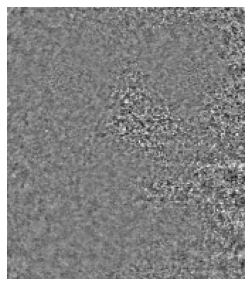

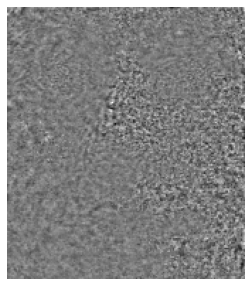

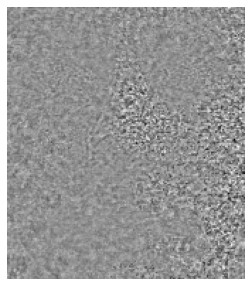

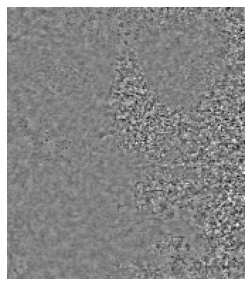

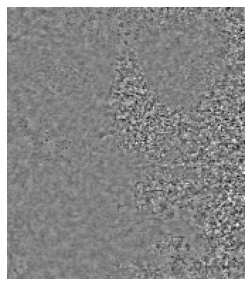

In [5]:
#Prints some example fisherfaces
matX = np.empty((0, X[0].size))
for row in X:
    matX = np.vstack((matX, np.asarray(row).reshape (1, -1) ))    
[D, W, mu] = fisherfaces (matX, y)

num_ims = 5
images = []
for i in range(num_ims):
    ff = W[:, i].reshape(X[0].shape)
    ff = np.asarray(ff)
    minX, maxX = np.min (X) , np.max(X)
    
    ff = ff - float(minX)
    ff = ff / float((maxX - minX))
    ff = ff * 255

    images.append(ff)

print("Exmaples of FisherFaces")
for i in range(len(images)):
    fig = plt.figure(figsize=(5, 5))
    plt.imshow(np.asarray(images[i]), cmap = cm.gray)
    plt.axis('off')

In [ ]:
#Splits into training and testing data and trains the model
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)
model = FisherfacesModel(X_train, y_train)

Expected = 11        Predicted = 11


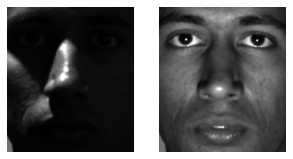



Expected = 35        Predicted = 35


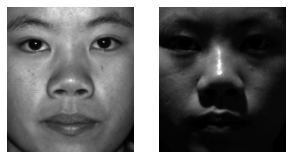



Expected = 5        Predicted = 5


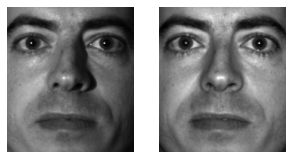



Expected = 21        Predicted = 21


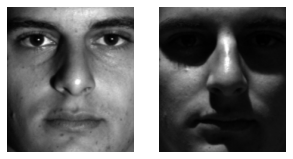



Expected = 5        Predicted = 28


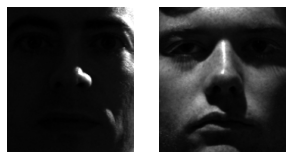



Expected = 20        Predicted = 20


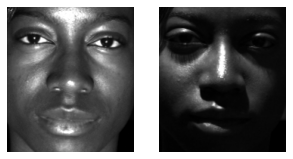



Expected = 25        Predicted = 25


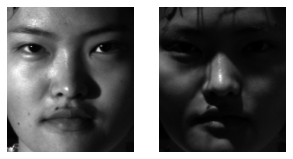



Expected = 1        Predicted = 1


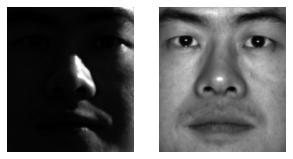



Expected = 25        Predicted = 25


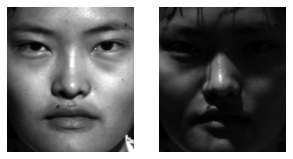



Expected = 5        Predicted = 5


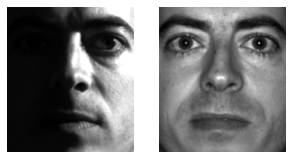



Expected = 9        Predicted = 31


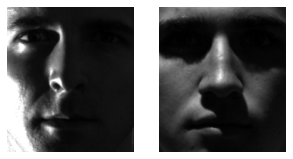



Expected = 23        Predicted = 23


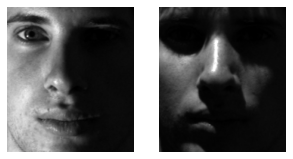



Expected = 6        Predicted = 6


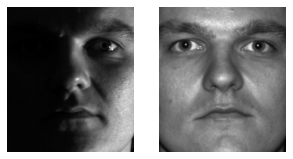



Expected = 15        Predicted = 15


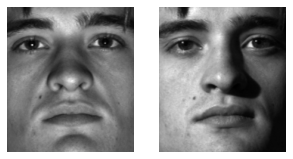



Expected = 0        Predicted = 18


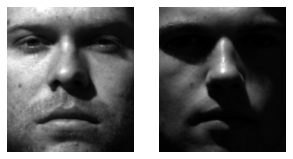



Expected = 27        Predicted = 34


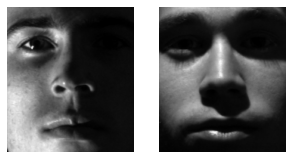



Expected = 33        Predicted = 33


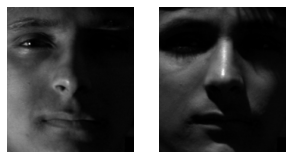



Expected = 0        Predicted = 0


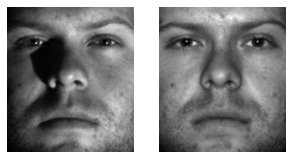



Expected = 23        Predicted = 36


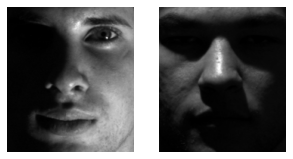



Expected = 17        Predicted = 17


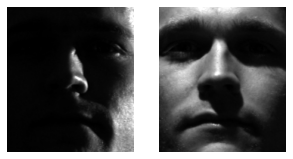



Expected = 18        Predicted = 18


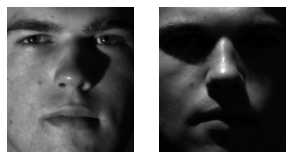



Expected = 25        Predicted = 25


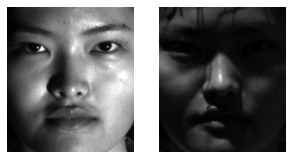



Expected = 37        Predicted = 37


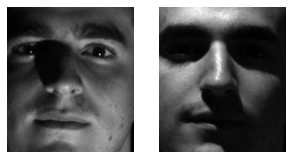



Expected = 36        Predicted = 36


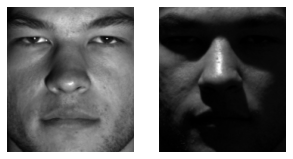



Expected = 33        Predicted = 33


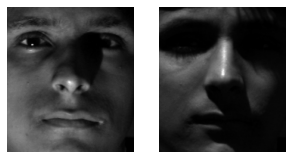



Expected = 25        Predicted = 25


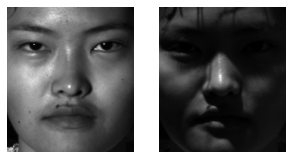



Expected = 31        Predicted = 31


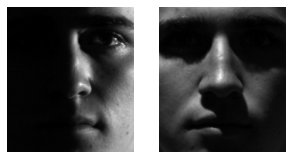



Expected = 19        Predicted = 19


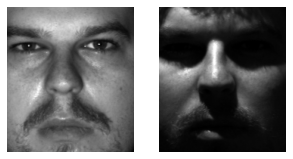



Expected = 5        Predicted = 5


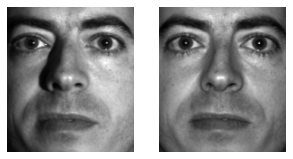



Expected = 28        Predicted = 28


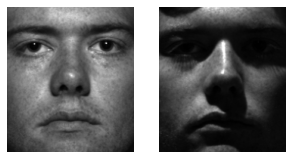



Expected = 32        Predicted = 32


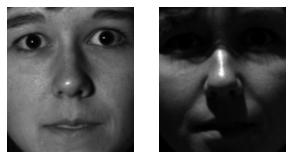



Expected = 26        Predicted = 31


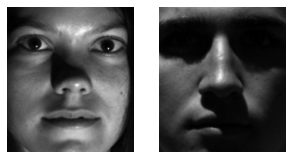



Expected = 6        Predicted = 6


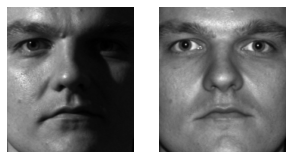



Expected = 3        Predicted = 3


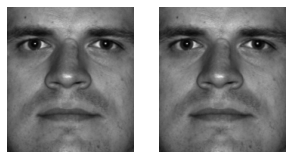



Expected = 25        Predicted = 25


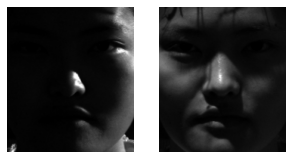



Expected = 25        Predicted = 35


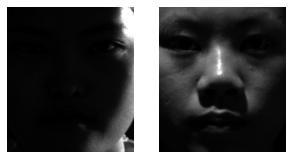



Expected = 0        Predicted = 0


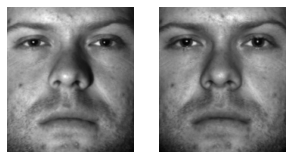



Expected = 11        Predicted = 11


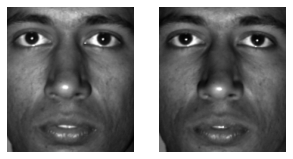



Expected = 36        Predicted = 36


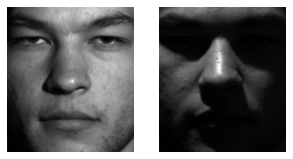



Expected = 17        Predicted = 17


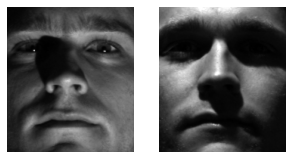



Expected = 8        Predicted = 8


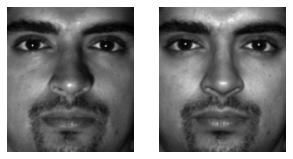



Expected = 18        Predicted = 18


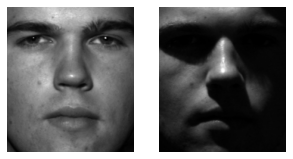



Expected = 7        Predicted = 3


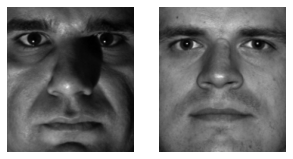



Expected = 34        Predicted = 34


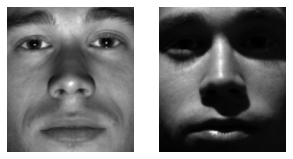



Expected = 30        Predicted = 7


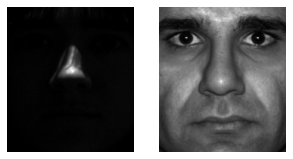



Expected = 26        Predicted = 26


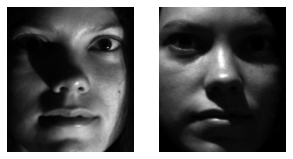



Expected = 16        Predicted = 16


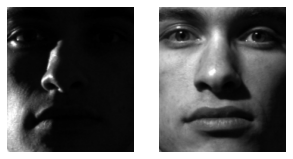



Expected = 31        Predicted = 31


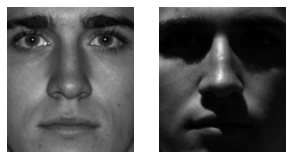



Expected = 35        Predicted = 35


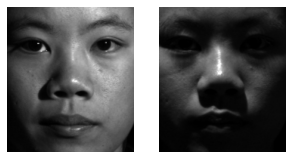



Expected = 10        Predicted = 27


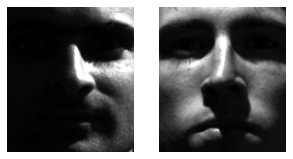



Expected = 34        Predicted = 31


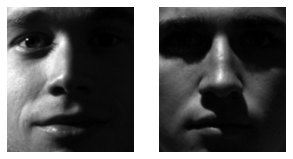



Expected = 2        Predicted = 2


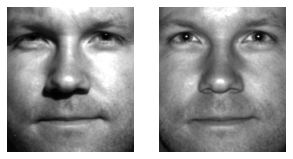



Expected = 30        Predicted = 7


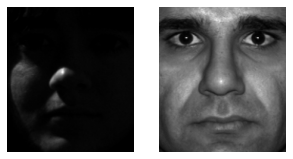



Expected = 32        Predicted = 32


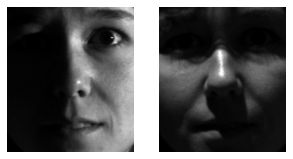



Expected = 37        Predicted = 37


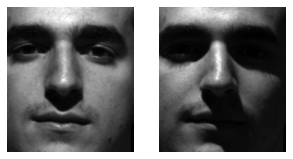



Expected = 37        Predicted = 37


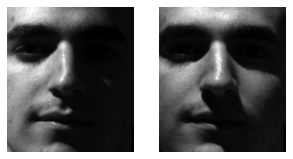



Expected = 21        Predicted = 18


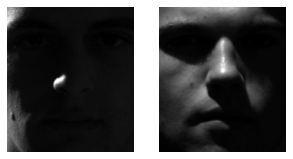



Expected = 2        Predicted = 0


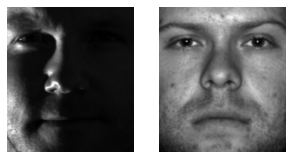



Expected = 28        Predicted = 28


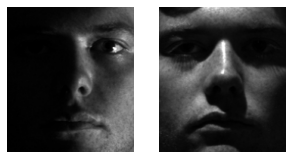



Expected = 33        Predicted = 33


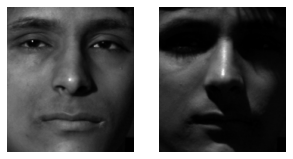



Expected = 18        Predicted = 29


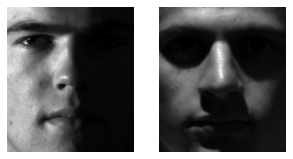



Expected = 21        Predicted = 21


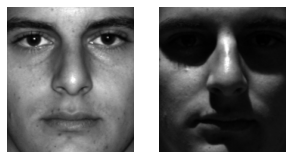



Expected = 29        Predicted = 29


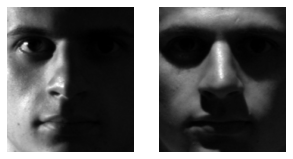



Expected = 17        Predicted = 17


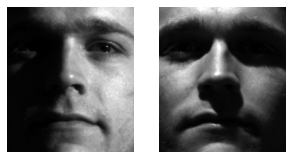



Expected = 4        Predicted = 25


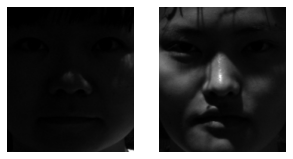



Expected = 0        Predicted = 0


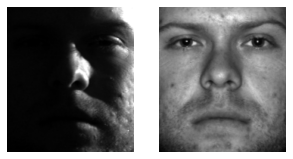



Expected = 31        Predicted = 33


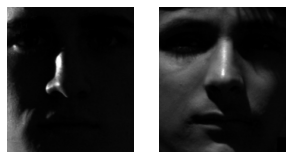



Expected = 14        Predicted = 14


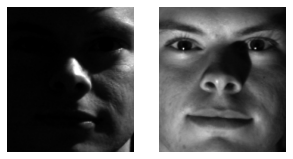



Expected = 16        Predicted = 16


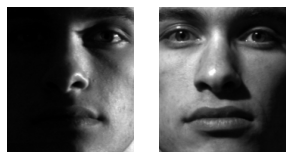



Expected = 26        Predicted = 26


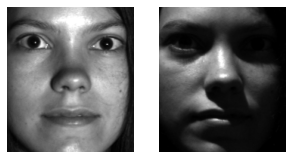



Expected = 34        Predicted = 22


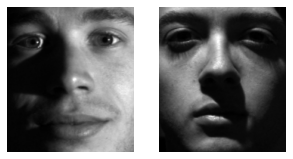



Expected = 20        Predicted = 20


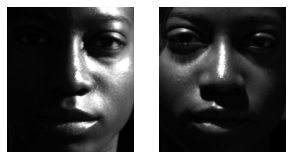



Expected = 6        Predicted = 6


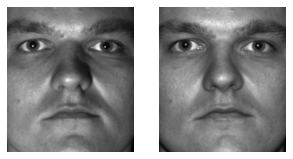



Expected = 10        Predicted = 10


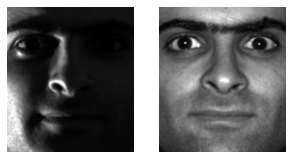



Expected = 2        Predicted = 2


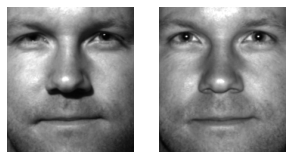



Expected = 11        Predicted = 11


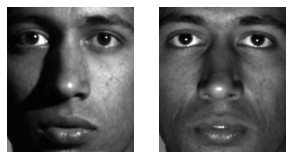



Expected = 18        Predicted = 18


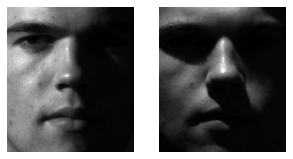



Expected = 19        Predicted = 19


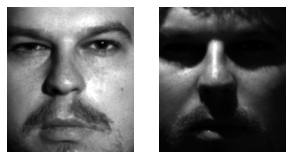



Expected = 11        Predicted = 11


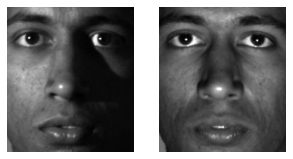



Expected = 9        Predicted = 9


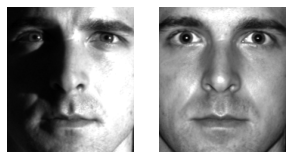



Expected = 8        Predicted = 8


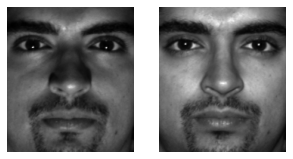



Expected = 24        Predicted = 24


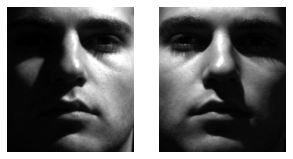



Expected = 36        Predicted = 23


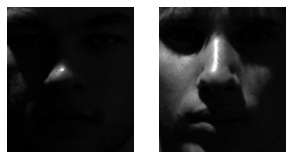



Expected = 30        Predicted = 30


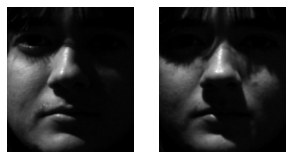



Expected = 14        Predicted = 14


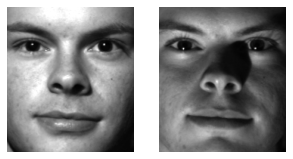



Expected = 31        Predicted = 31


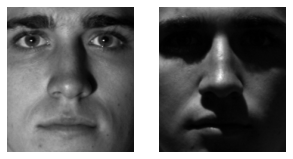



Expected = 19        Predicted = 32


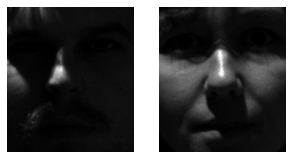



Expected = 16        Predicted = 16


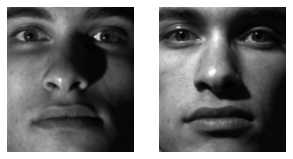



Expected = 24        Predicted = 24


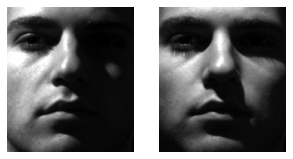



Expected = 25        Predicted = 4


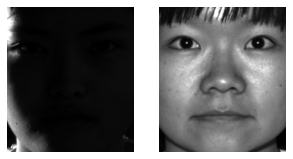



Expected = 1        Predicted = 1


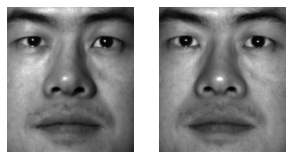



Expected = 14        Predicted = 14


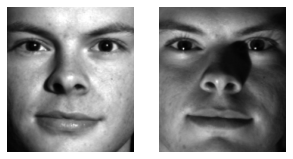



Expected = 10        Predicted = 26


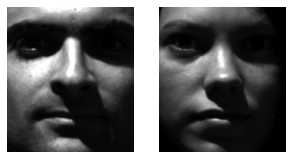



Expected = 1        Predicted = 1


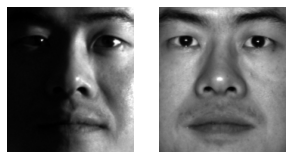



Expected = 5        Predicted = 5


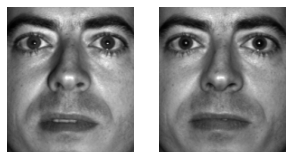



Expected = 24        Predicted = 24


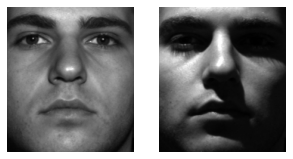



Expected = 30        Predicted = 30


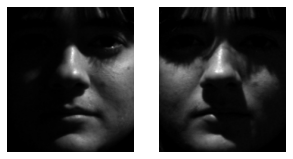



Expected = 10        Predicted = 10


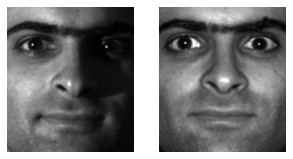



Expected = 4        Predicted = 35


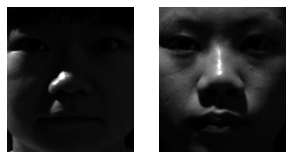



Expected = 2        Predicted = 2


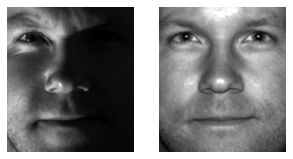



Expected = 20        Predicted = 20


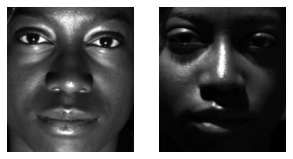



Expected = 24        Predicted = 24


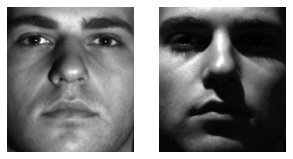



Expected = 37        Predicted = 37


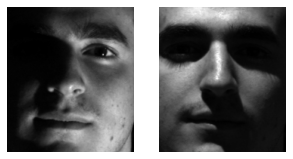



Expected = 18        Predicted = 18


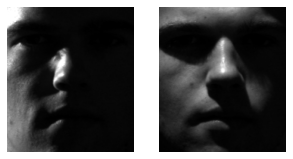



Expected = 36        Predicted = 36


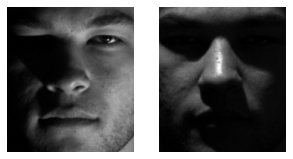



Expected = 4        Predicted = 4


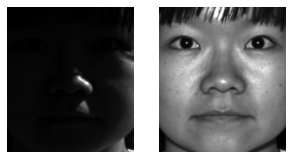



Expected = 33        Predicted = 36


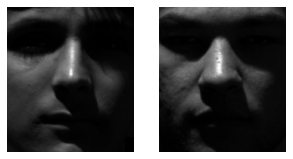



Expected = 14        Predicted = 9


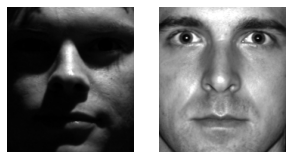



Expected = 21        Predicted = 7


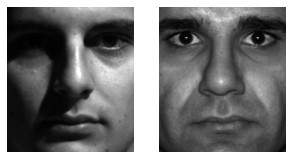



Expected = 36        Predicted = 35


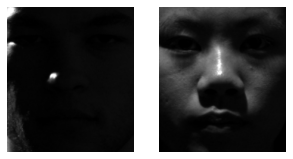



Expected = 24        Predicted = 24


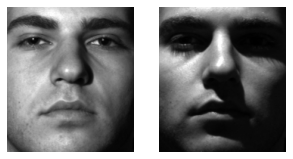



Expected = 2        Predicted = 0


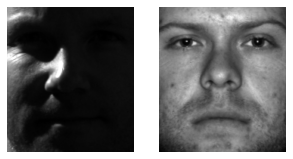



Expected = 0        Predicted = 0


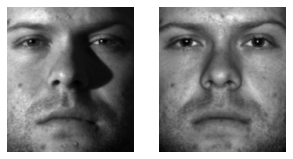



Expected = 16        Predicted = 16


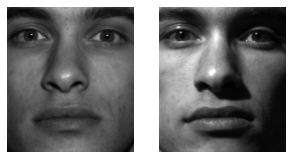



Expected = 15        Predicted = 15


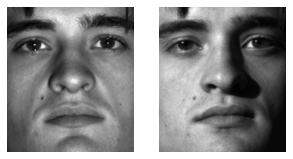



Expected = 21        Predicted = 21


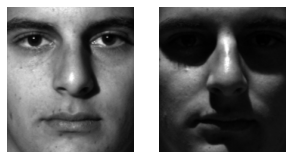



Expected = 24        Predicted = 24


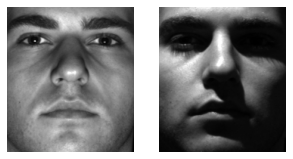



Expected = 4        Predicted = 4


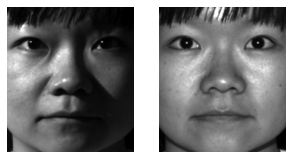



Expected = 2        Predicted = 7


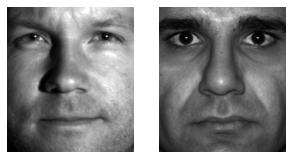



Expected = 35        Predicted = 6


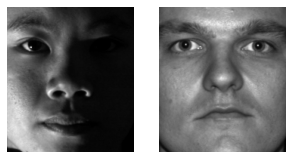



Expected = 24        Predicted = 24


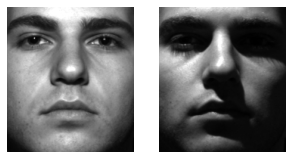



Expected = 4        Predicted = 35


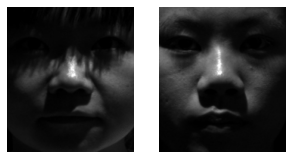



Expected = 33        Predicted = 33


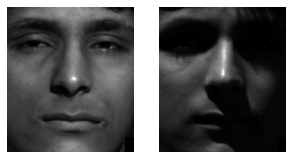



Expected = 8        Predicted = 35


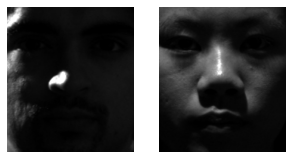



Expected = 23        Predicted = 23


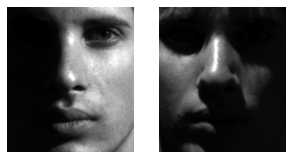



Expected = 0        Predicted = 0


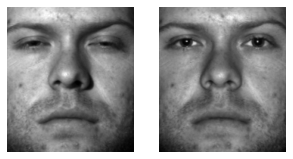



Expected = 12        Predicted = 12


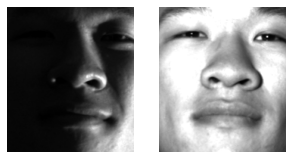



Expected = 5        Predicted = 21


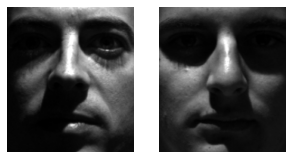



Expected = 7        Predicted = 7


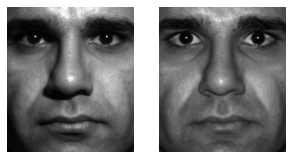



Expected = 5        Predicted = 5


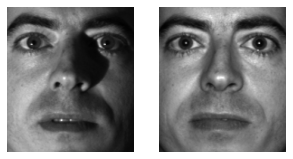



Expected = 34        Predicted = 31


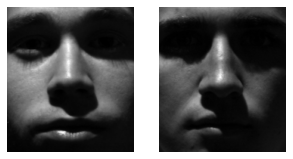



Expected = 12        Predicted = 21


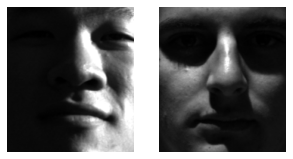



Expected = 6        Predicted = 6


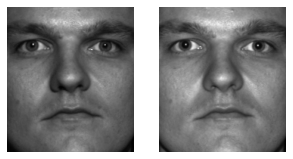



Expected = 2        Predicted = 17


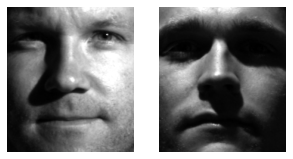



Expected = 5        Predicted = 5


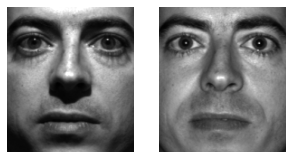



Expected = 15        Predicted = 15


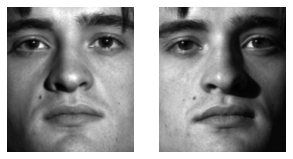



Expected = 22        Predicted = 22


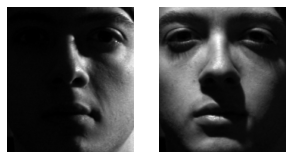



Expected = 11        Predicted = 31


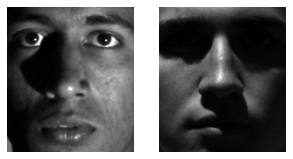



Expected = 9        Predicted = 9


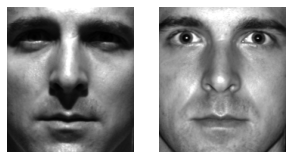



Expected = 22        Predicted = 22


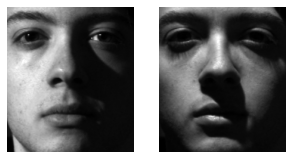



Expected = 34        Predicted = 34


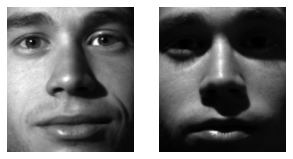



Expected = 29        Predicted = 18


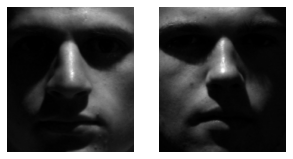



Expected = 33        Predicted = 33


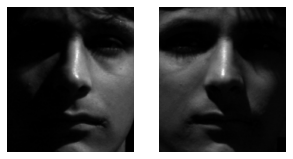



Expected = 27        Predicted = 34


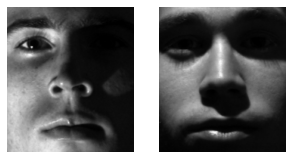



Expected = 36        Predicted = 36


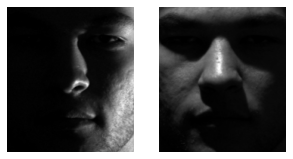



Expected = 1        Predicted = 1


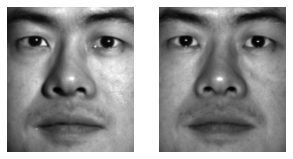



Expected = 18        Predicted = 18


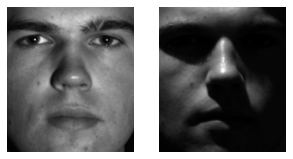



Expected = 2        Predicted = 2


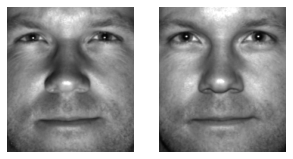



Expected = 35        Predicted = 35


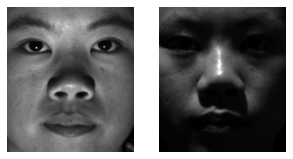



Expected = 20        Predicted = 20


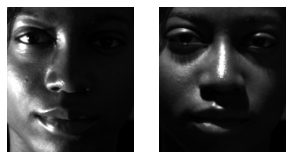



Expected = 17        Predicted = 17


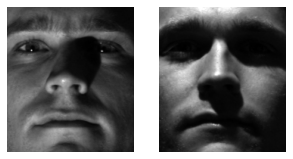



Expected = 20        Predicted = 20


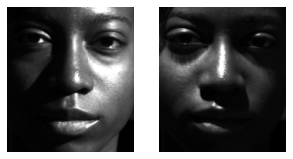



Expected = 2        Predicted = 2


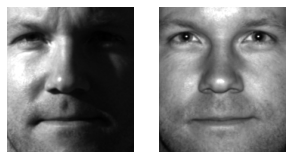



Expected = 9        Predicted = 9


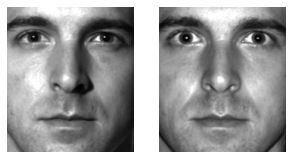



Expected = 25        Predicted = 25


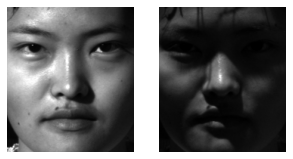



Expected = 15        Predicted = 3


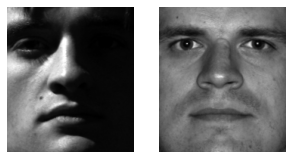



Expected = 22        Predicted = 22


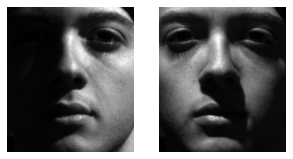



Expected = 9        Predicted = 9


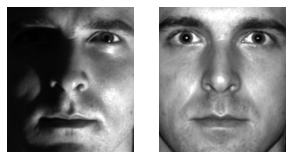



Expected = 31        Predicted = 31


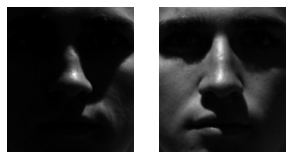



Expected = 30        Predicted = 30


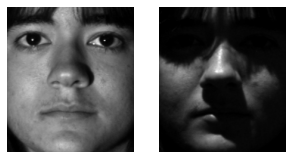



Expected = 7        Predicted = 7


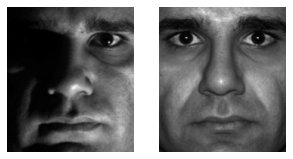



Expected = 24        Predicted = 24


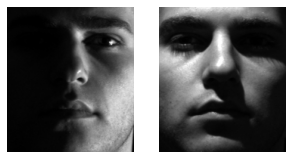



Expected = 18        Predicted = 18


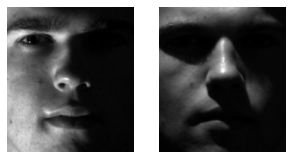



Expected = 33        Predicted = 33


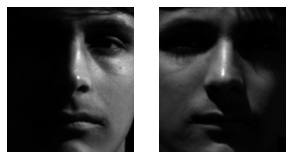



Expected = 19        Predicted = 19


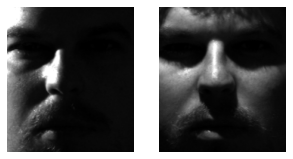



Expected = 32        Predicted = 32


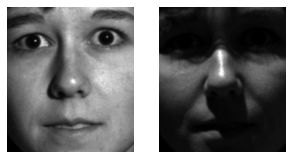



Expected = 16        Predicted = 16


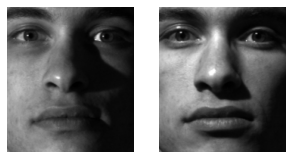



Expected = 33        Predicted = 33


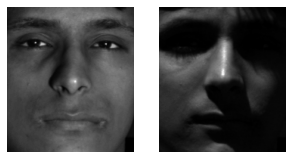



Expected = 32        Predicted = 32


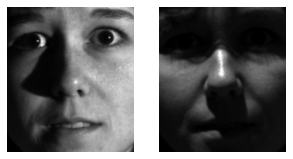



Expected = 17        Predicted = 17


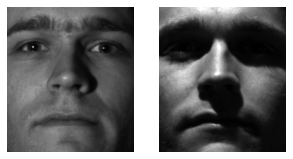



Expected = 30        Predicted = 30


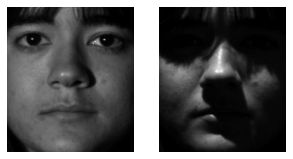



Expected = 30        Predicted = 1


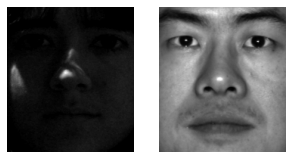



Expected = 34        Predicted = 34


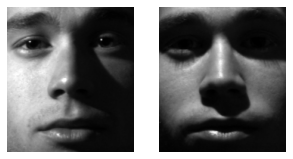



Expected = 16        Predicted = 16


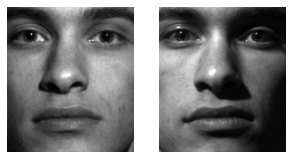



Expected = 34        Predicted = 34


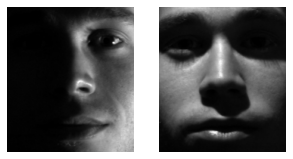



Expected = 5        Predicted = 5


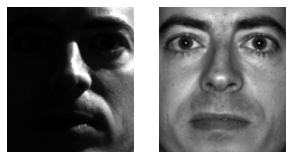



Expected = 32        Predicted = 32


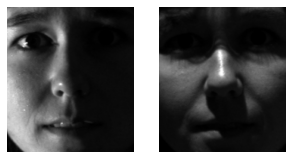



Expected = 19        Predicted = 19


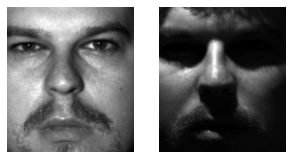



Expected = 13        Predicted = 13


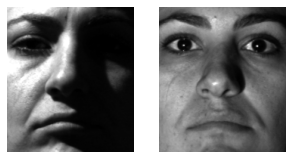



Expected = 3        Predicted = 3


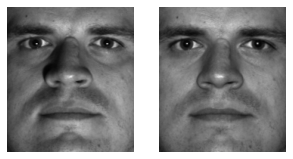



Expected = 23        Predicted = 23


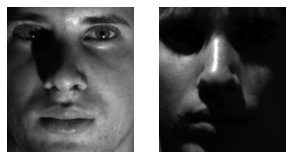



Expected = 22        Predicted = 22


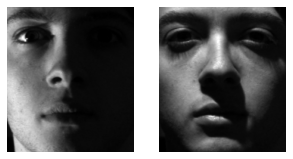



Expected = 8        Predicted = 8


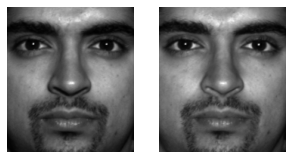



Expected = 23        Predicted = 16


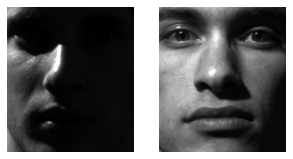



Expected = 34        Predicted = 34


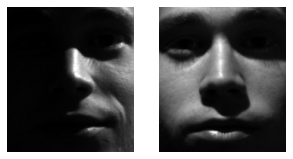



Expected = 18        Predicted = 18


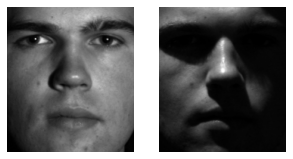



Expected = 23        Predicted = 35


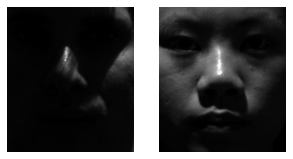



Expected = 25        Predicted = 25


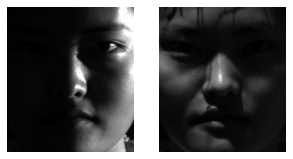



Expected = 13        Predicted = 13


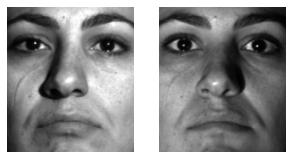



Expected = 37        Predicted = 37


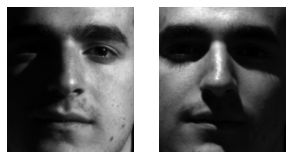



Expected = 3        Predicted = 3


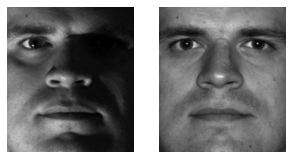



Expected = 35        Predicted = 35


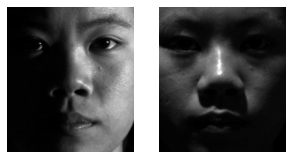



Expected = 20        Predicted = 20


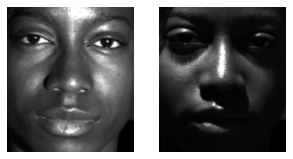



Expected = 33        Predicted = 33


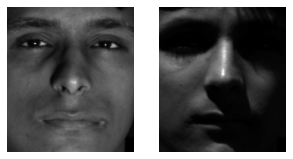



Expected = 20        Predicted = 20


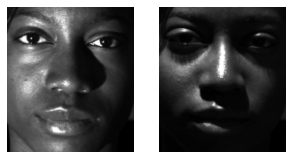



Expected = 15        Predicted = 15


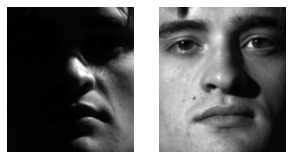



Expected = 29        Predicted = 31


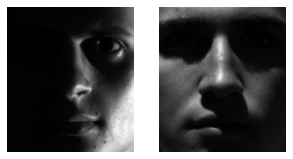



Expected = 8        Predicted = 8


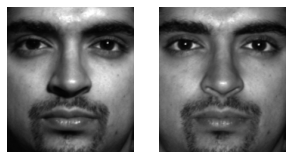



Expected = 19        Predicted = 19


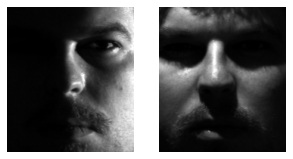



Expected = 4        Predicted = 4


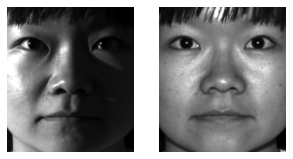



Expected = 30        Predicted = 30


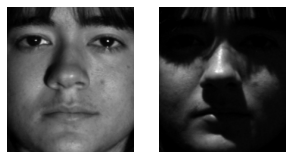



Expected = 11        Predicted = 35


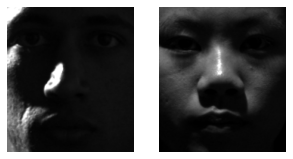



Expected = 32        Predicted = 32


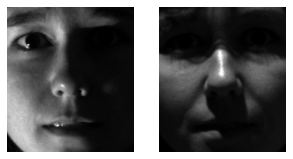



Expected = 0        Predicted = 6


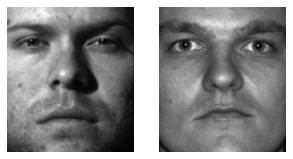



Expected = 2        Predicted = 2


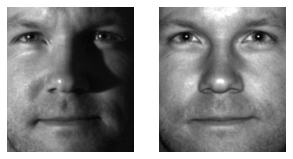



Expected = 18        Predicted = 4


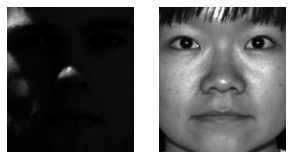



Expected = 9        Predicted = 9


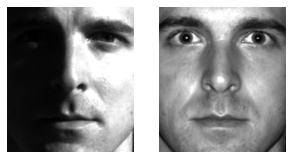



Expected = 33        Predicted = 33


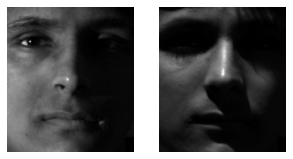



Expected = 33        Predicted = 35


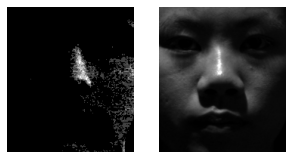



Expected = 5        Predicted = 5


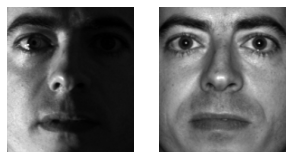



Expected = 11        Predicted = 11


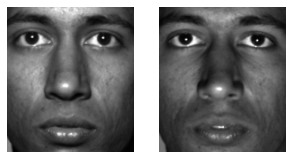



Expected = 10        Predicted = 28


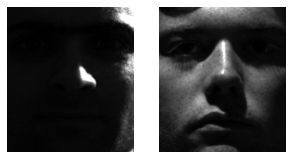



Expected = 3        Predicted = 3


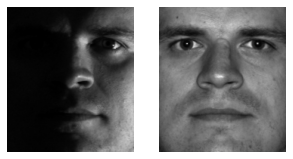



Expected = 37        Predicted = 37


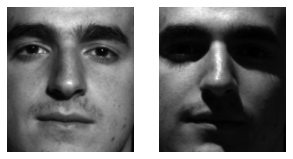



Expected = 4        Predicted = 4


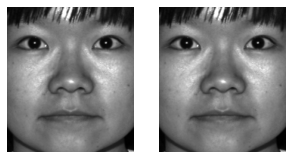



Expected = 36        Predicted = 36


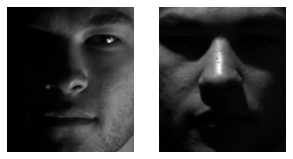



Expected = 11        Predicted = 11


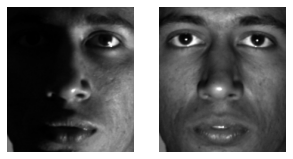



Expected = 30        Predicted = 30


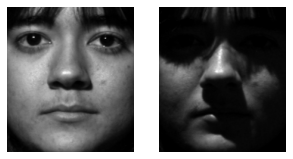



Expected = 6        Predicted = 6


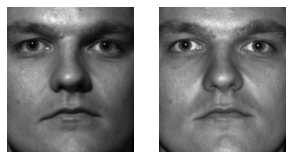



Expected = 17        Predicted = 17


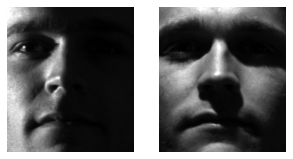



Expected = 29        Predicted = 29


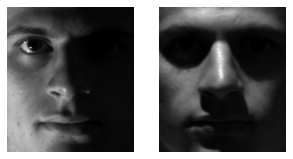



Expected = 34        Predicted = 34


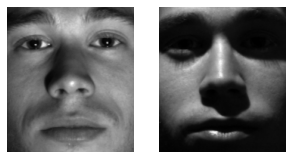



Expected = 14        Predicted = 1


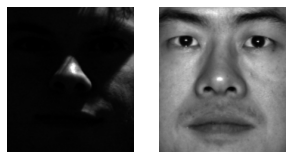



Expected = 0        Predicted = 32


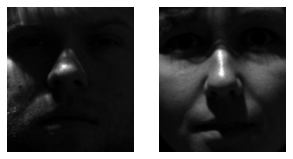



Expected = 12        Predicted = 12


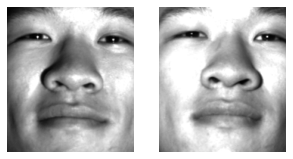



Expected = 10        Predicted = 33


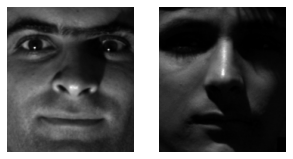



Expected = 28        Predicted = 28


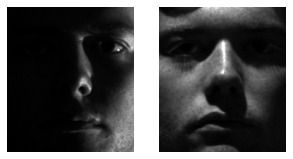



Expected = 11        Predicted = 11


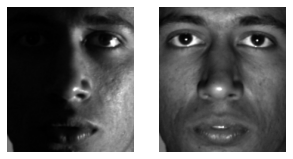



Expected = 15        Predicted = 15


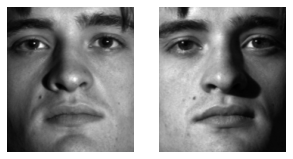



Expected = 33        Predicted = 33


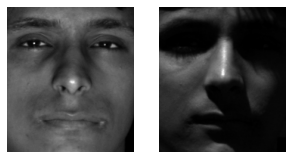



Expected = 12        Predicted = 37


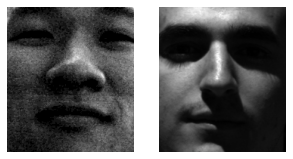



Expected = 32        Predicted = 32


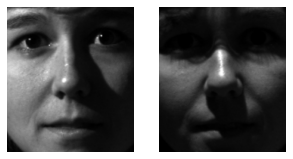



Expected = 37        Predicted = 37


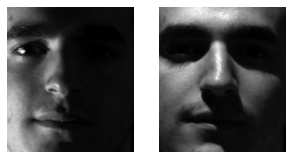



Expected = 23        Predicted = 23


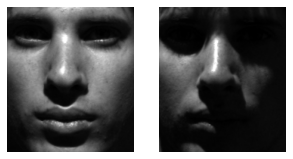



Expected = 0        Predicted = 14


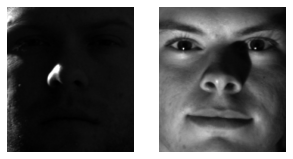



Expected = 16        Predicted = 16


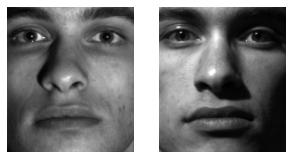



Expected = 2        Predicted = 2


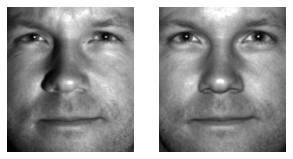



Expected = 13        Predicted = 13


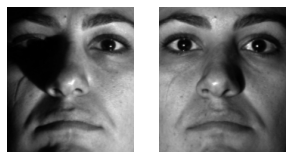



Expected = 12        Predicted = 12


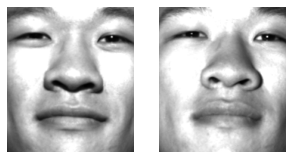



Expected = 2        Predicted = 2


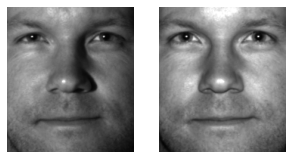



Expected = 14        Predicted = 14


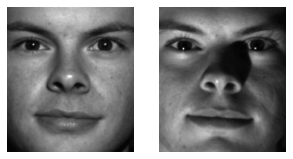



Expected = 26        Predicted = 26


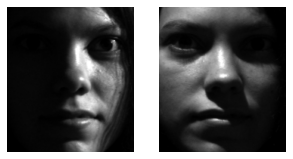



Expected = 13        Predicted = 13


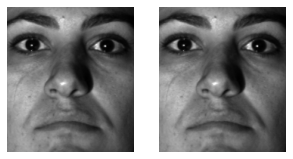



Expected = 27        Predicted = 27


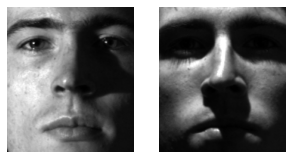



Expected = 3        Predicted = 3


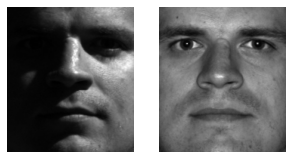



Expected = 33        Predicted = 20


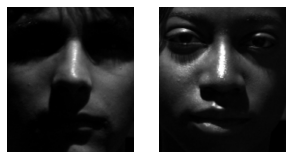



Expected = 7        Predicted = 31


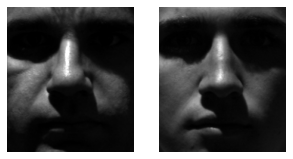



Expected = 29        Predicted = 29


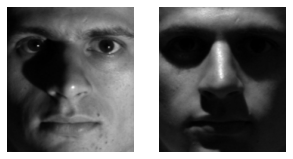



Expected = 19        Predicted = 19


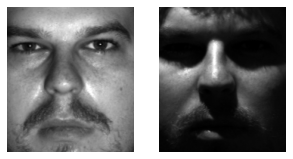



Expected = 8        Predicted = 8


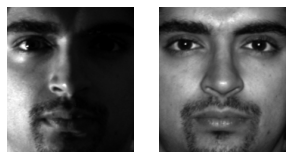



Expected = 12        Predicted = 12


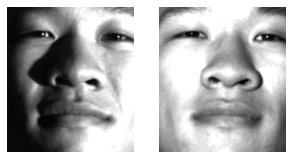



Expected = 34        Predicted = 6


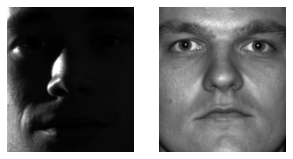



Expected = 17        Predicted = 17


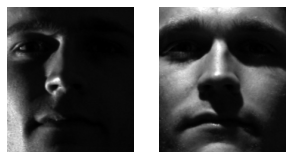



Expected = 12        Predicted = 12


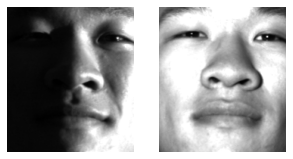



Expected = 14        Predicted = 29


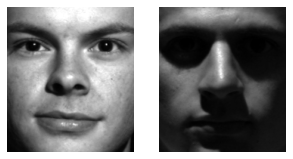



Expected = 23        Predicted = 23


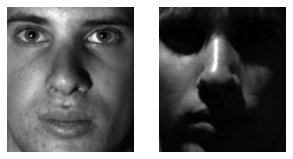



Expected = 17        Predicted = 17


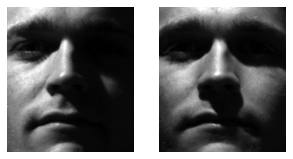



Expected = 18        Predicted = 18


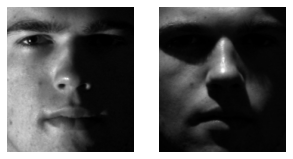



Expected = 4        Predicted = 4


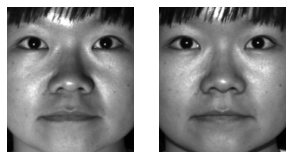



Expected = 5        Predicted = 5


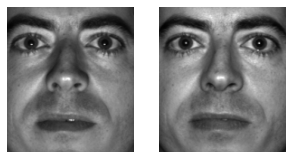



Expected = 22        Predicted = 22


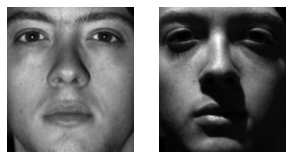



Expected = 4        Predicted = 25


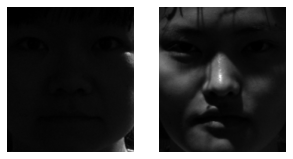



Expected = 8        Predicted = 18


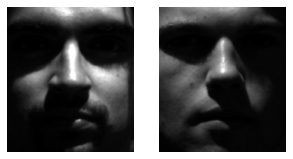



Expected = 8        Predicted = 8


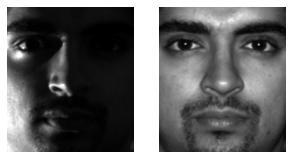



Expected = 25        Predicted = 4


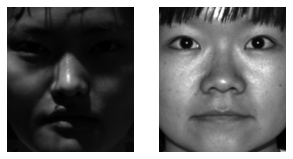



Expected = 28        Predicted = 31


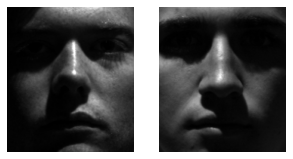



Expected = 5        Predicted = 3


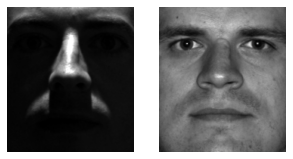



Expected = 9        Predicted = 24


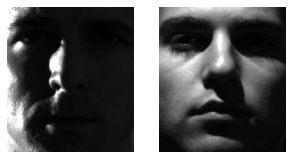



Expected = 9        Predicted = 9


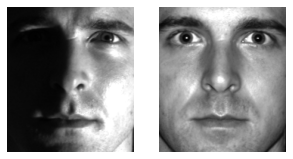



Expected = 31        Predicted = 31


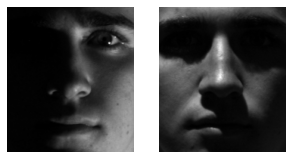



Expected = 3        Predicted = 3


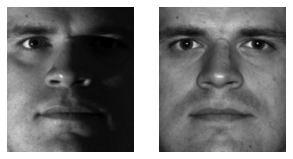



Expected = 5        Predicted = 5


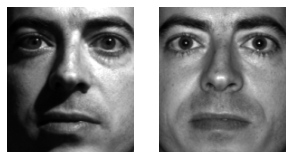



Expected = 21        Predicted = 21


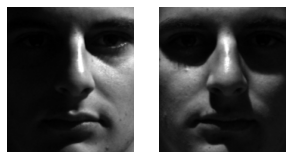



Expected = 25        Predicted = 25


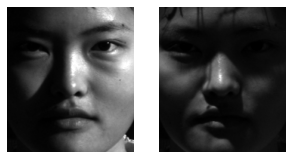



Expected = 2        Predicted = 2


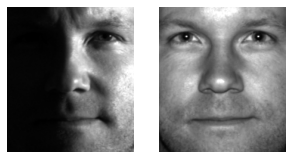



Expected = 36        Predicted = 35


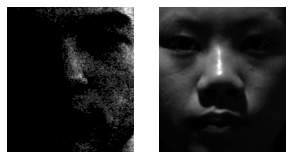



Expected = 21        Predicted = 21


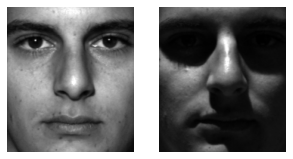



Expected = 30        Predicted = 30


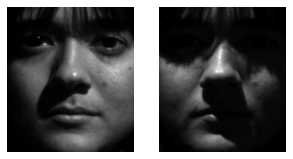



Expected = 3        Predicted = 3


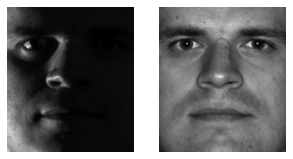



Expected = 7        Predicted = 7


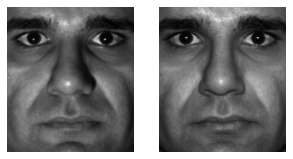



Expected = 13        Predicted = 1


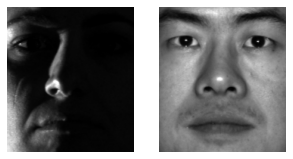



Expected = 15        Predicted = 15


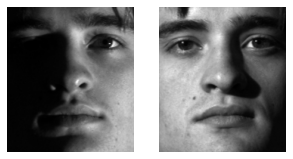



Expected = 7        Predicted = 7


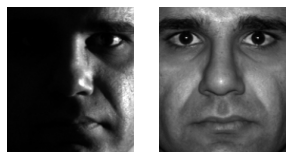



Expected = 13        Predicted = 6


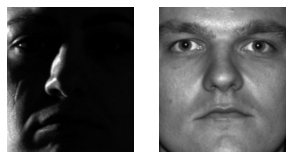



Expected = 14        Predicted = 3


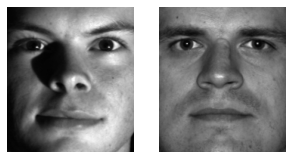



Expected = 7        Predicted = 7


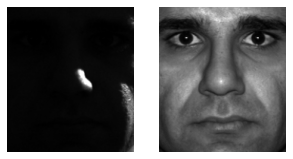



Expected = 22        Predicted = 22


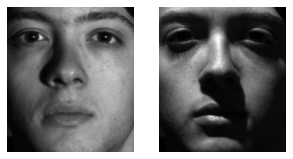



Expected = 9        Predicted = 9


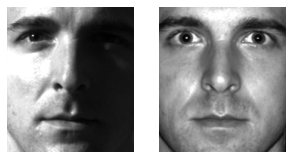



Expected = 17        Predicted = 17


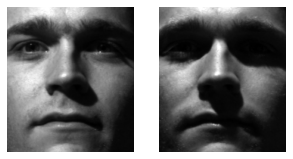



Expected = 8        Predicted = 8


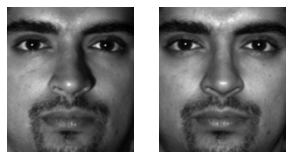



Expected = 24        Predicted = 24


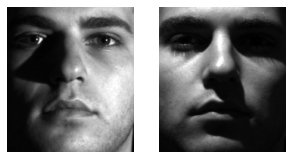



Expected = 13        Predicted = 13


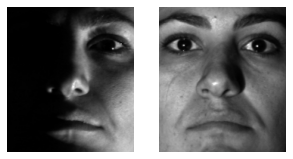



Expected = 20        Predicted = 20


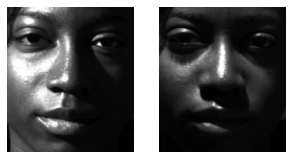



Expected = 12        Predicted = 12


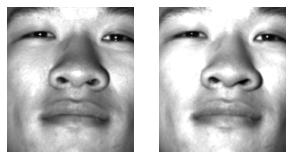



Expected = 37        Predicted = 37


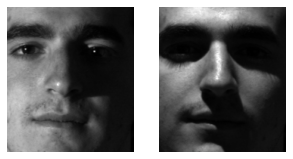



Expected = 32        Predicted = 32


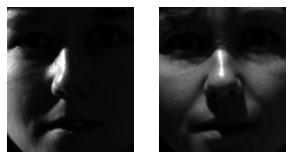



Expected = 9        Predicted = 9


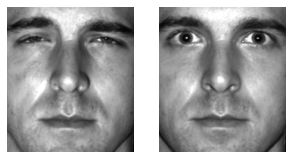



Expected = 37        Predicted = 37


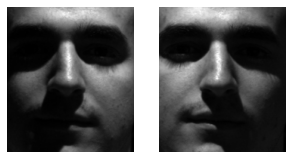



Expected = 13        Predicted = 13


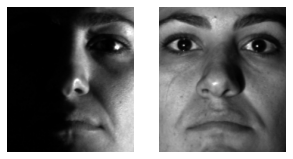



Expected = 18        Predicted = 18


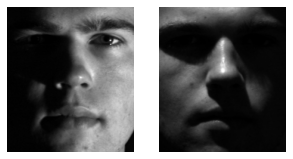



Expected = 12        Predicted = 12


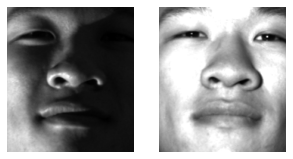



Expected = 14        Predicted = 14


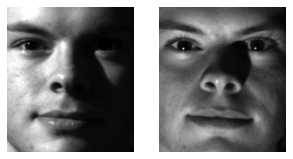



Expected = 0        Predicted = 0


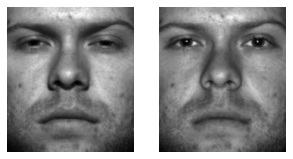



Expected = 23        Predicted = 33


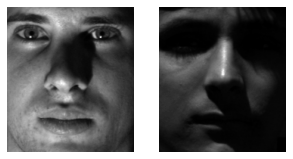



Expected = 22        Predicted = 3


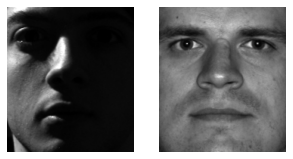



Expected = 17        Predicted = 17


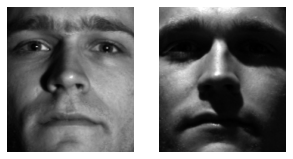



Expected = 9        Predicted = 36


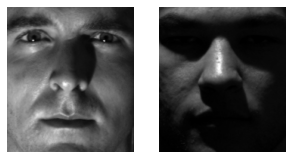



Expected = 20        Predicted = 20


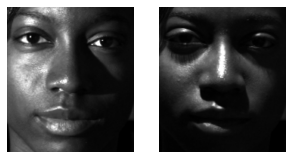



Expected = 33        Predicted = 33


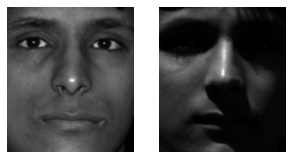



Expected = 21        Predicted = 21


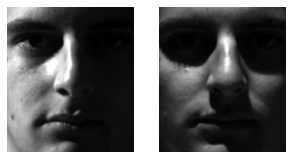



Expected = 13        Predicted = 13


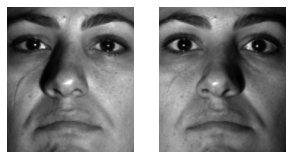



Expected = 7        Predicted = 7


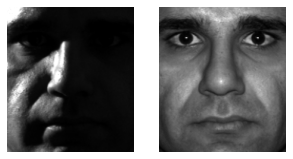



Expected = 2        Predicted = 2


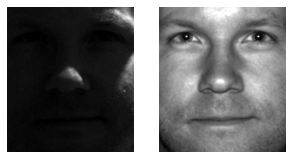



Expected = 8        Predicted = 8


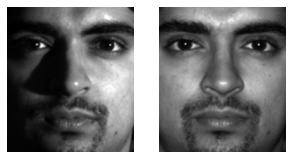



Expected = 18        Predicted = 18


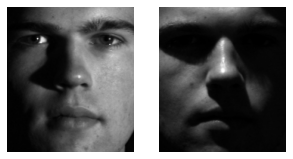



Expected = 8        Predicted = 8


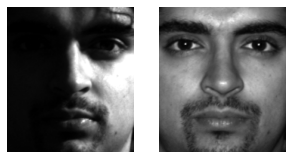



Expected = 15        Predicted = 6


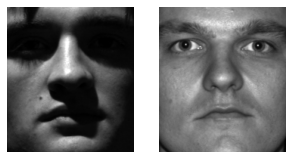



Expected = 8        Predicted = 33


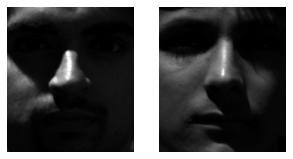



Expected = 23        Predicted = 23


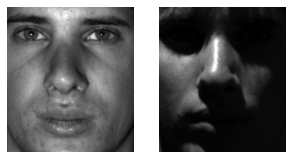



Expected = 14        Predicted = 14


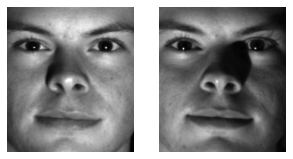



Expected = 26        Predicted = 26


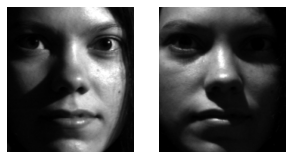



Expected = 15        Predicted = 15


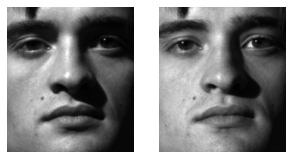



Expected = 26        Predicted = 26


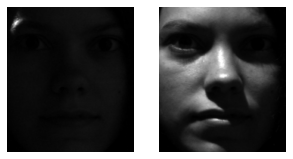



Expected = 36        Predicted = 36


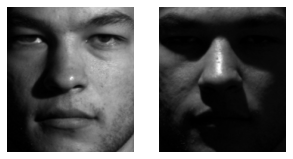



Expected = 15        Predicted = 15


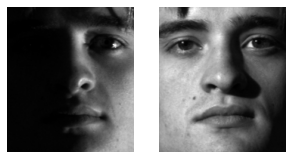



Expected = 22        Predicted = 22


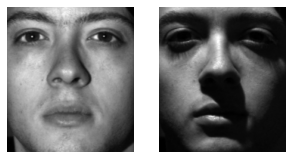



Expected = 35        Predicted = 32


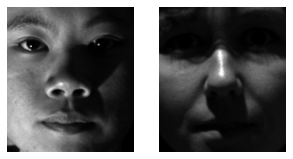



Expected = 16        Predicted = 16


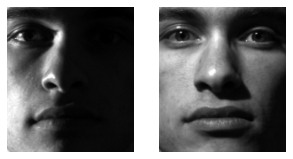



Expected = 5        Predicted = 5


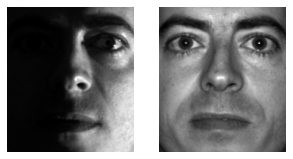



Expected = 25        Predicted = 28


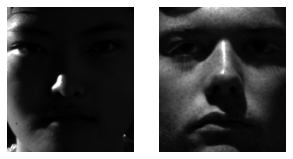



Expected = 8        Predicted = 8


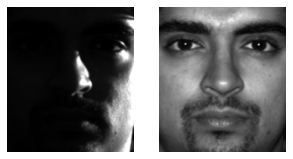



Expected = 2        Predicted = 2


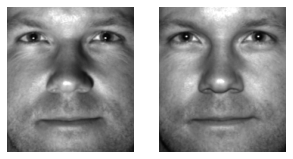



Expected = 27        Predicted = 27


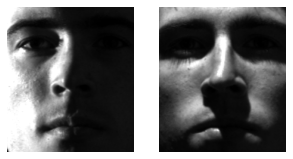



Expected = 10        Predicted = 10


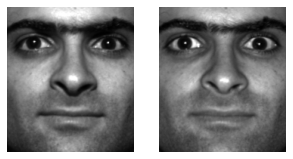



Expected = 12        Predicted = 3


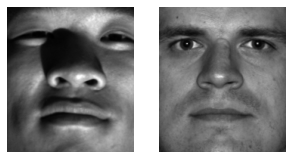



Expected = 10        Predicted = 8


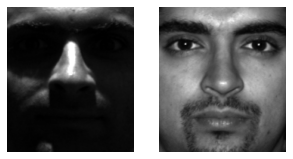



Expected = 12        Predicted = 12


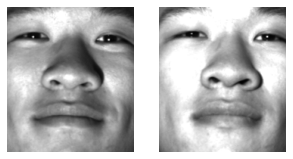



Expected = 34        Predicted = 34


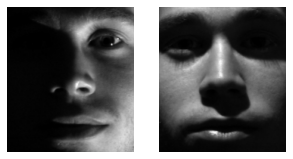



Expected = 27        Predicted = 27


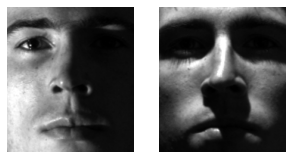



Expected = 3        Predicted = 3


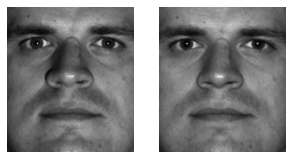



Expected = 13        Predicted = 13


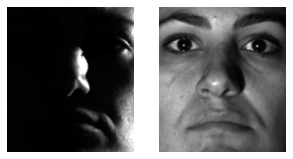



Expected = 10        Predicted = 10


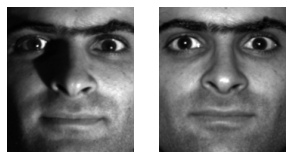



Expected = 9        Predicted = 2


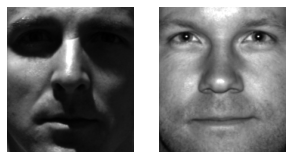



Expected = 24        Predicted = 24


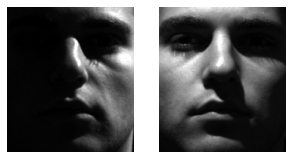



Expected = 15        Predicted = 15


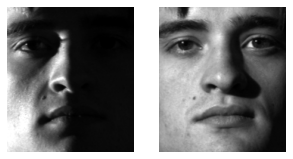



Expected = 34        Predicted = 11


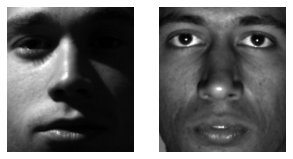



Expected = 3        Predicted = 3


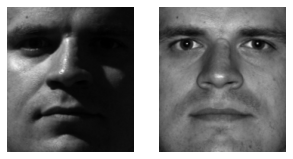



Expected = 30        Predicted = 30


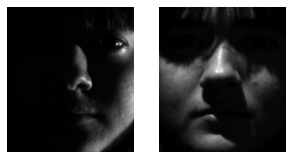



Expected = 3        Predicted = 3


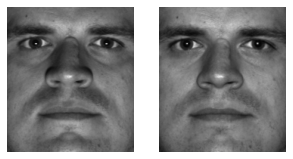



Expected = 22        Predicted = 22


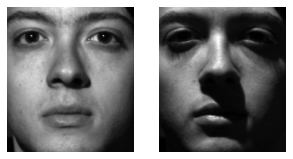



Expected = 6        Predicted = 6


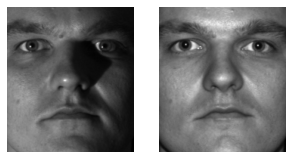



Expected = 35        Predicted = 35


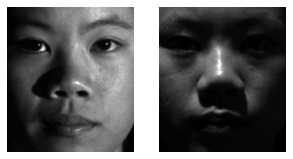



Expected = 2        Predicted = 2


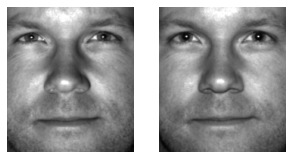



Expected = 37        Predicted = 37


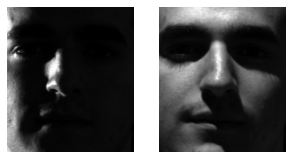



Expected = 0        Predicted = 0


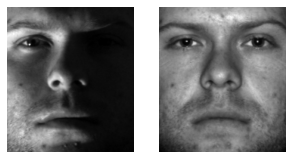



Expected = 0        Predicted = 0


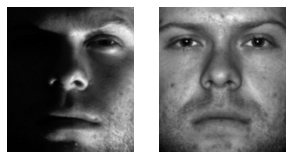



Expected = 1        Predicted = 1


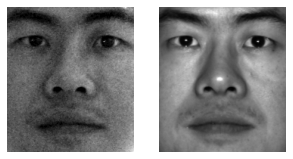



Expected = 4        Predicted = 4


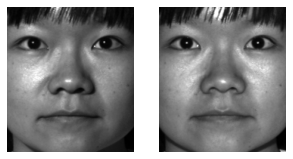



Expected = 26        Predicted = 33


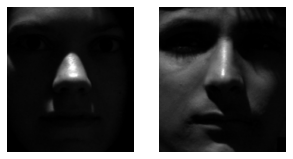



Expected = 23        Predicted = 23


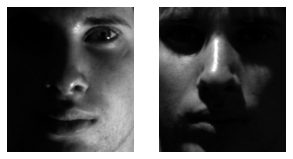



Expected = 36        Predicted = 36


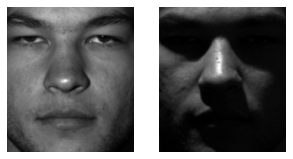



Expected = 31        Predicted = 31


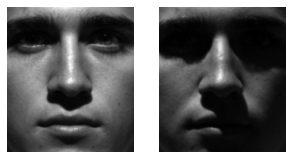



Expected = 4        Predicted = 4


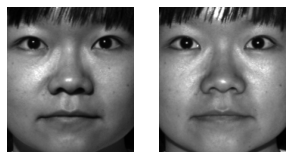



Expected = 24        Predicted = 24


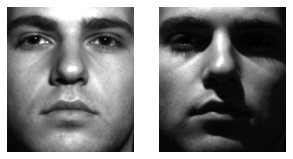



Expected = 5        Predicted = 5


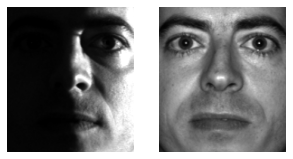



Expected = 19        Predicted = 19


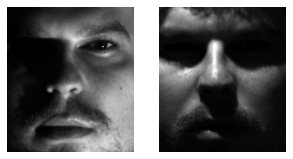



Expected = 27        Predicted = 31


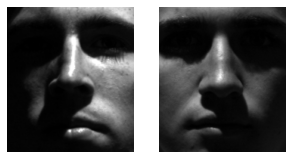



Expected = 28        Predicted = 28


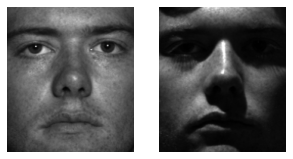



Expected = 35        Predicted = 6


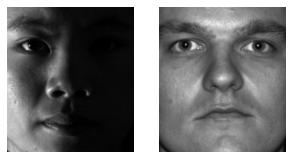



Expected = 21        Predicted = 21


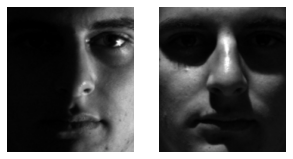



Expected = 8        Predicted = 8


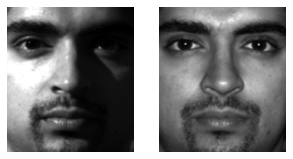



Expected = 0        Predicted = 0


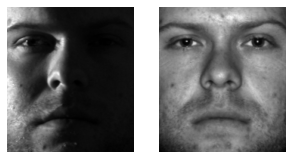



Expected = 8        Predicted = 8


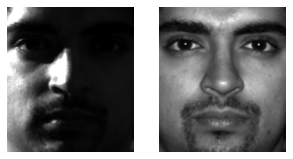



Expected = 5        Predicted = 5


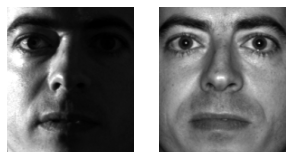



Expected = 18        Predicted = 18


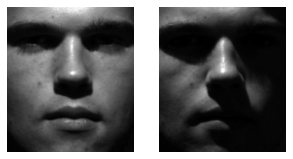



Expected = 8        Predicted = 8


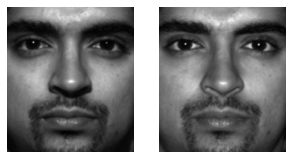



Expected = 20        Predicted = 20


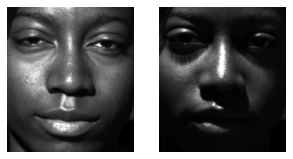



Expected = 24        Predicted = 24


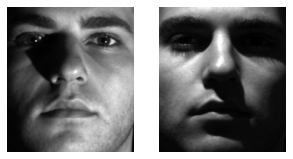



Expected = 8        Predicted = 8


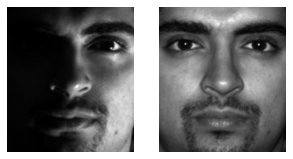



Expected = 6        Predicted = 18


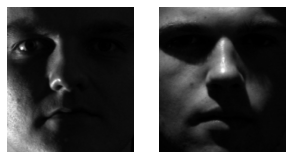



Expected = 6        Predicted = 6


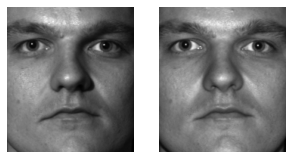



Expected = 19        Predicted = 19


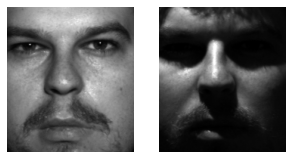



Expected = 35        Predicted = 35


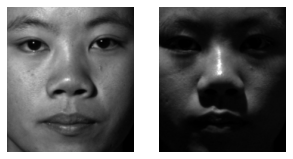



Expected = 6        Predicted = 6


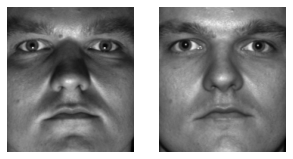



Expected = 2        Predicted = 2


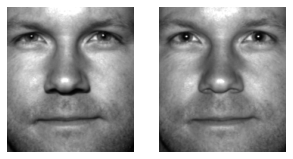



Expected = 7        Predicted = 7


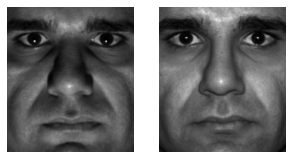



Expected = 30        Predicted = 7


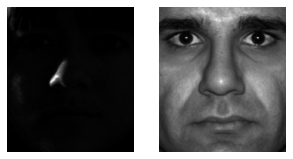



Expected = 15        Predicted = 15


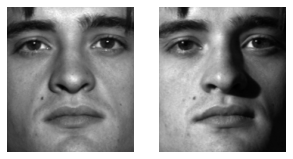



Expected = 1        Predicted = 1


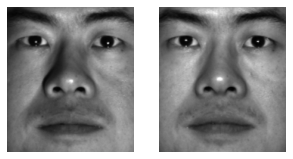



Expected = 6        Predicted = 3


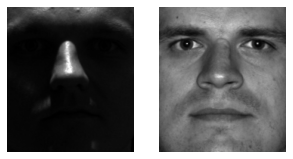



Expected = 7        Predicted = 7


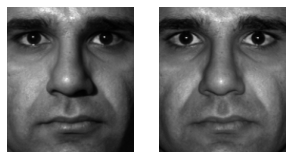



Expected = 1        Predicted = 1


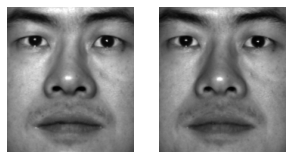



Expected = 17        Predicted = 17


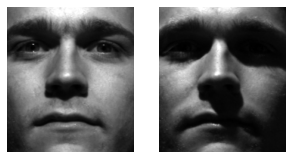



Expected = 30        Predicted = 30


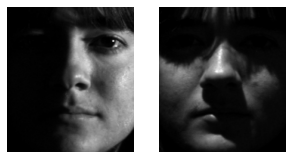



Expected = 9        Predicted = 9


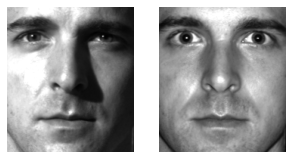



Expected = 7        Predicted = 7


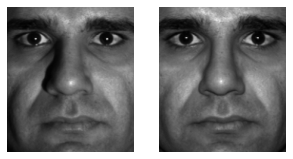



Expected = 25        Predicted = 25


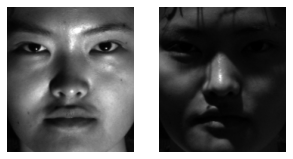



Expected = 19        Predicted = 19


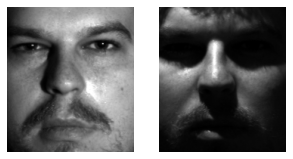



Expected = 2        Predicted = 6


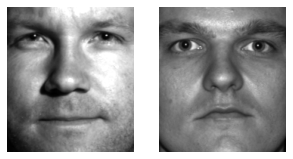



Expected = 23        Predicted = 23


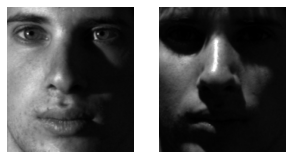



Expected = 11        Predicted = 11


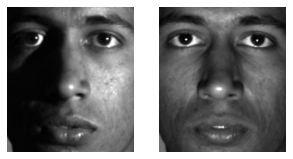



Expected = 29        Predicted = 29


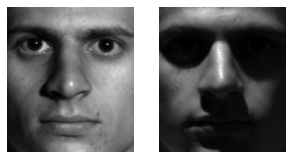



Expected = 27        Predicted = 27


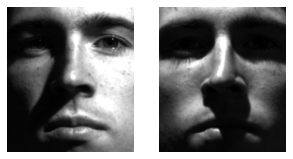



Expected = 31        Predicted = 31


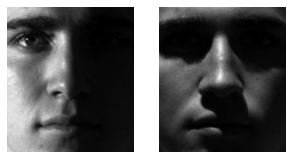



Expected = 28        Predicted = 28


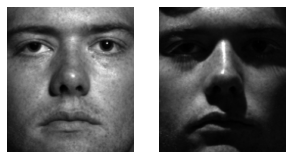



Expected = 19        Predicted = 19


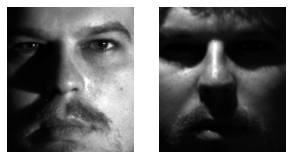



Expected = 7        Predicted = 31


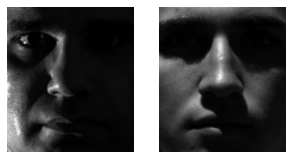



Expected = 4        Predicted = 4


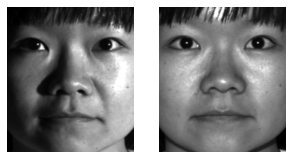



Expected = 24        Predicted = 24


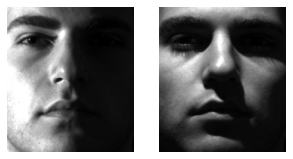



Expected = 28        Predicted = 28


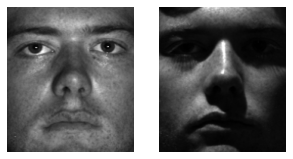



Expected = 2        Predicted = 2


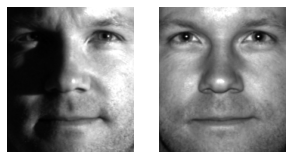



Expected = 7        Predicted = 7


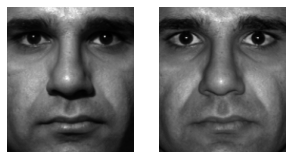



Expected = 11        Predicted = 11


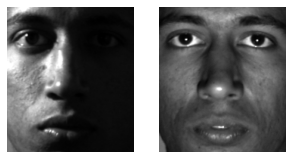



Expected = 13        Predicted = 13


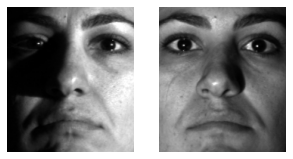



Expected = 11        Predicted = 11


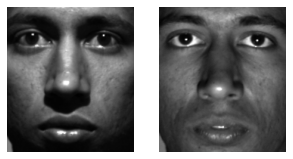



Expected = 11        Predicted = 31


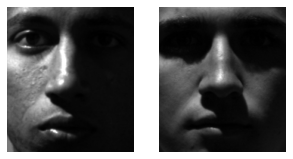



Expected = 19        Predicted = 19


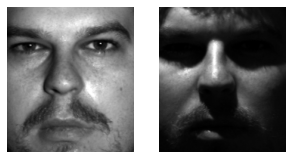



Expected = 26        Predicted = 36


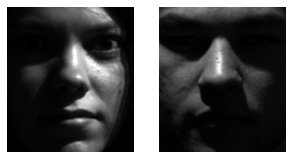



Expected = 10        Predicted = 10


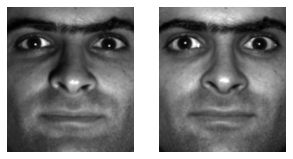



Expected = 10        Predicted = 10


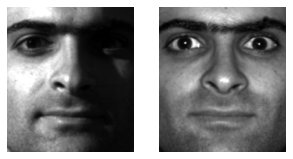



Expected = 22        Predicted = 22


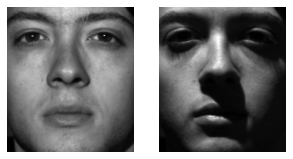



Expected = 28        Predicted = 33


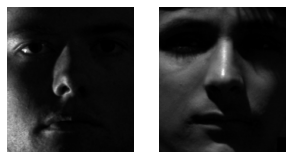



Expected = 19        Predicted = 19


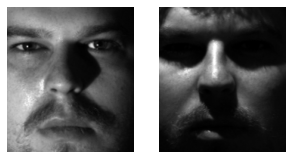



Expected = 6        Predicted = 6


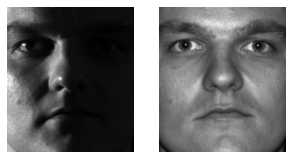



Expected = 14        Predicted = 6


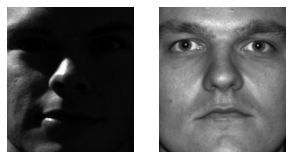



Expected = 36        Predicted = 36


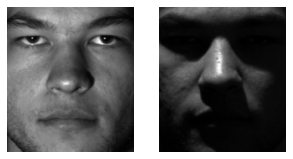



Expected = 23        Predicted = 23


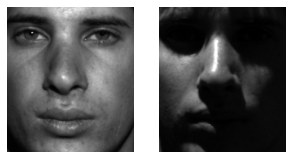



Expected = 24        Predicted = 24


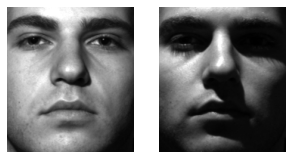



Expected = 3        Predicted = 3


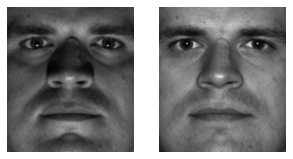



Expected = 3        Predicted = 21


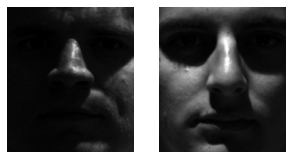



Expected = 31        Predicted = 31


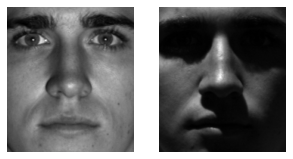



Expected = 37        Predicted = 37


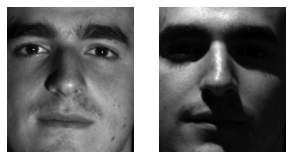



Expected = 4        Predicted = 4


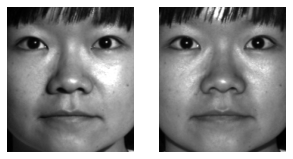



Expected = 4        Predicted = 4


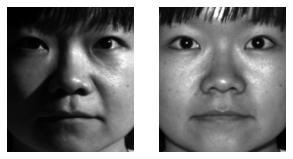



Expected = 32        Predicted = 32


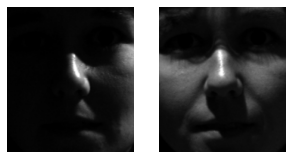



Expected = 33        Predicted = 33


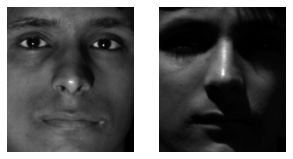



Expected = 26        Predicted = 26


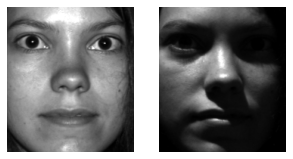



Expected = 4        Predicted = 4


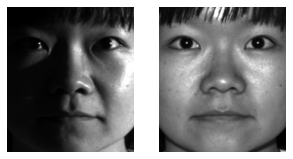



Expected = 31        Predicted = 31


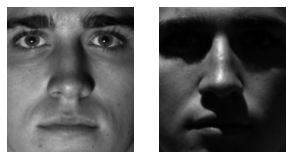



Expected = 36        Predicted = 36


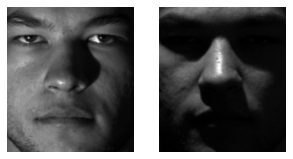



Expected = 28        Predicted = 28


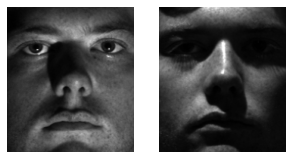



Expected = 8        Predicted = 8


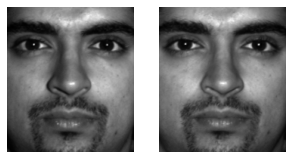



Expected = 3        Predicted = 3


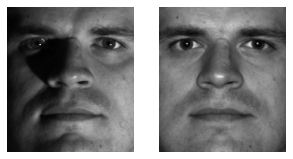



Expected = 8        Predicted = 8


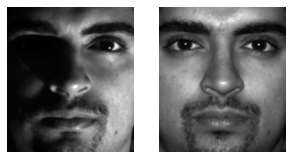



Expected = 22        Predicted = 22


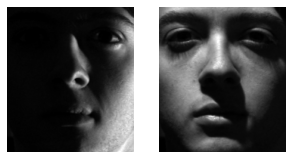



Expected = 1        Predicted = 1


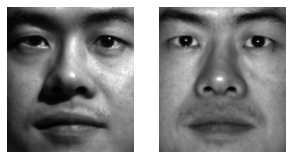



Expected = 31        Predicted = 31


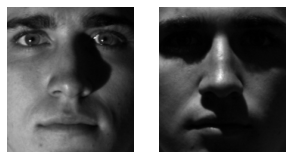



Expected = 10        Predicted = 10


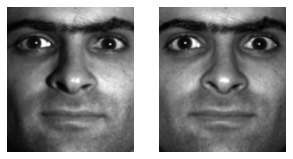



Expected = 8        Predicted = 8


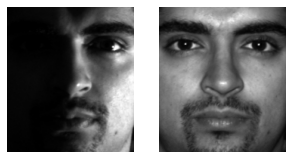



Expected = 5        Predicted = 5


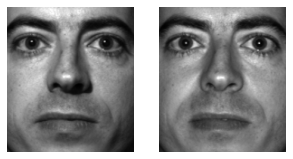



Expected = 4        Predicted = 4


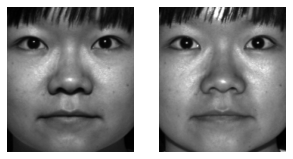



Expected = 26        Predicted = 36


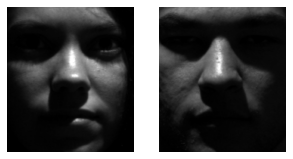



Expected = 37        Predicted = 37


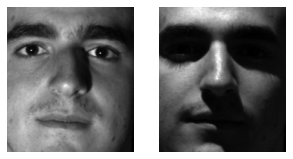



Expected = 4        Predicted = 35


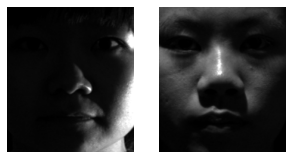



Expected = 34        Predicted = 34


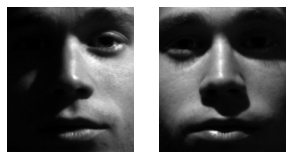



Expected = 1        Predicted = 1


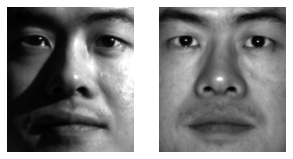



Expected = 35        Predicted = 35


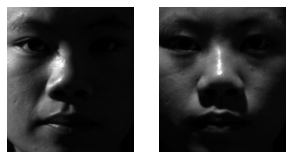



Expected = 32        Predicted = 33


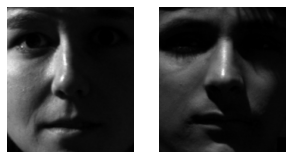



Expected = 13        Predicted = 13


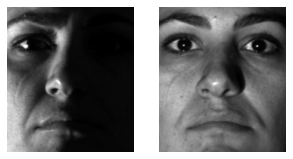



Expected = 22        Predicted = 22


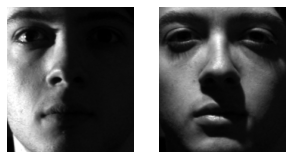



Expected = 35        Predicted = 36


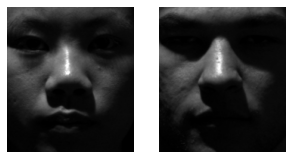



Expected = 2        Predicted = 2


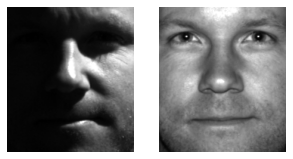



Expected = 0        Predicted = 0


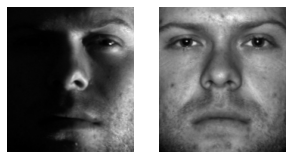



Expected = 1        Predicted = 1


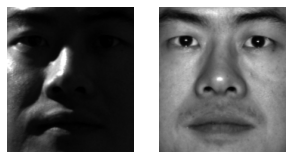



Expected = 16        Predicted = 16


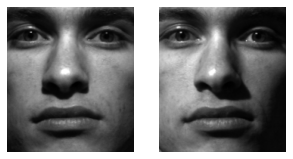



Expected = 11        Predicted = 11


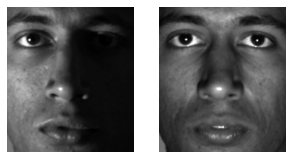



Expected = 5        Predicted = 9


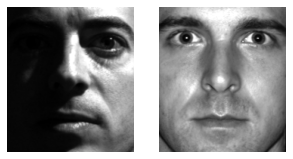



Expected = 13        Predicted = 13


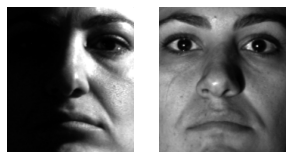



Expected = 14        Predicted = 14


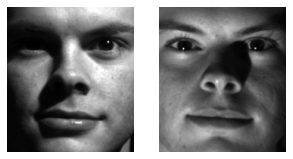



Expected = 20        Predicted = 20


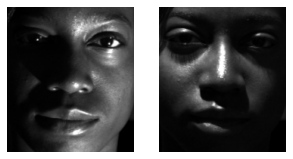



Expected = 17        Predicted = 17


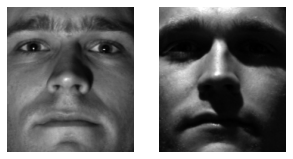



Expected = 32        Predicted = 32


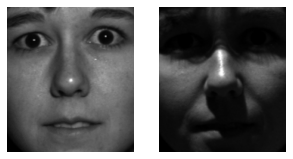



Expected = 3        Predicted = 3


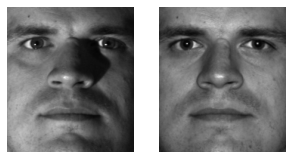



Expected = 30        Predicted = 30


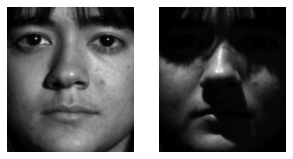



Expected = 12        Predicted = 12


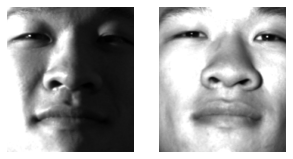



Expected = 20        Predicted = 20


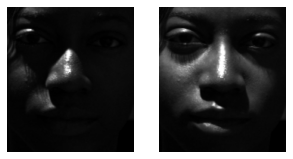



Expected = 23        Predicted = 35


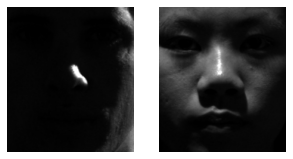



Expected = 34        Predicted = 34


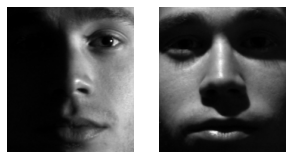



Expected = 15        Predicted = 15


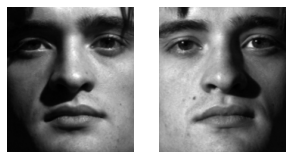



Expected = 21        Predicted = 21


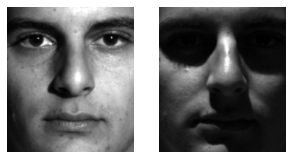



Expected = 17        Predicted = 17


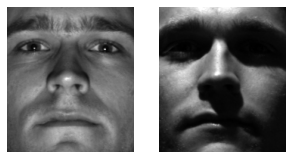



Expected = 14        Predicted = 14


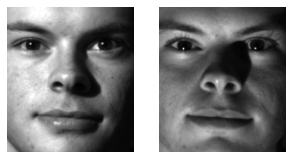



Expected = 26        Predicted = 33


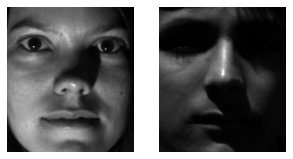



Accuracy:  79.5031055900621 %


In [15]:
#Runs the testing and prints the testing results
total = 0.0
correct = 0.0

for i in range(len(y_test)):
    prediction = model.test(X_test[i])
    print("Expected =", y_test[i], "     ", " Predicted =", prediction)
    
    fig = plt.figure(figsize=(5,5))
    fig.add_subplot(1,2,1)
    plt.imshow(X_test[i], cmap = cm.gray)
    plt.axis('off')

    fig.add_subplot(1,2,2)
    plt.imshow(X[prediction*64], cmap = cm.gray)
    plt.axis('off')
    plt.show()
    
    print ("\n")
    
    if (prediction == y_test[i]):
        correct = correct + 1
    total = total + 1

accuracy = (correct/total)*100
print ("Accuracy: ", accuracy, "%")